In [10]:
%load_ext autoreload
%autoreload 2

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from utils import plot_factors_covariate_2d

from famo.plotting import plot_training_curve
from famo.utils_io import load_model

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
adata = ad.read_h5ad("data/adata_10X.h5ad")
adata.obsm["spatial"] = adata.obs[["cell_centroid_x", "cell_centroid_y"]].values

In [4]:
# prismo_model = CORE(device="cuda:0")
# prismo_model.fit(
#     data=adata,
#     n_factors=10,
#     weight_prior="SnS",
#     factor_prior="GP",
#     likelihoods="Normal",
#     covariates_obsm_key="spatial",
#     max_epochs=3000,
#     early_stopper_patience=20,
#     lr=5e-2,
#     plot_data_overview=False,
#     save=True,
#     save_path="prismo_spatial_model",
#     init_scale=0.1,
#     gp_n_inducing=2000,
#     seed=5432,
#     batch_size=10000,
#     print_every=1,
# )

prismo_model = load_model("prismo_spatial_model")

Model loaded from prismo_spatial_model/model.pkl
Parameters loaded from prismo_spatial_model/params.save


In [4]:
plot_training_curve(prismo_model)

alt.Chart(...)

In [5]:
z = prismo_model.get_factors()["group_1"].T
w = prismo_model.get_weights()["view_1"]

In [19]:
subsample_id = np.random.choice(z.shape[1], 000)

In [20]:
plot_factors_covariate_2d(z.values.T[subsample_id], prismo_model.covariates["group_1"][subsample_id])

alt.HConcatChart(...)

In [21]:
adata

AnnData object with n_obs × n_vars = 164527 × 308
    obs: 'transcripts', 'unique_transcripts', 'cell_centroid_x', 'cell_centroid_y', 'cell_area', 'nucleus_centroid_x', 'nucleus_centroid_y', 'nucleus_area', 'percent_cytoplasmic', 'has_nucleus', 'celltype_major'
    var: 'feature_types', 'genome', 'percent_assigned', 'percent_cytoplasmic', 'raw_counts'
    uns: 'log1p', 'metrics'
    obsm: 'X_pca', 'X_umap', 'rep', 'spatial'
    layers: 'raw'

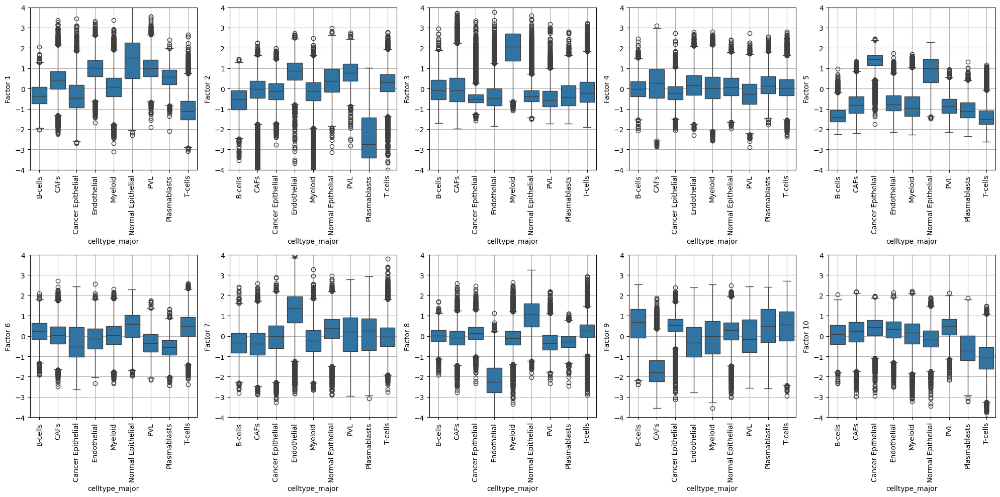

In [36]:
df = pd.concat([z.T, adata.obs], axis=1)

fig, axs = plt.subplots(2, 5, figsize=(20, 10))

for i in range(10):
    ax = axs.flatten()[i]
    sns.boxplot(x='celltype_major', y=f'Factor {i+1}', data=df, ax=ax)
    ax.set_ylim(-4., 4.)
    ax.grid()
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.tight_layout()

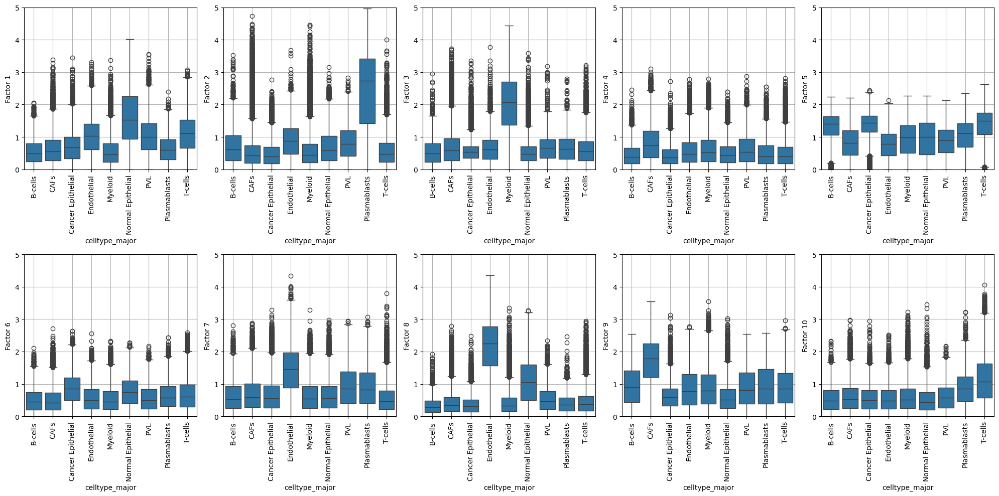

In [38]:
df = pd.concat([z.abs().T, adata.obs], axis=1)

fig, axs = plt.subplots(2, 5, figsize=(20, 10))

for i in range(10):
    ax = axs.flatten()[i]
    sns.boxplot(x='celltype_major', y=f'Factor {i+1}', data=df, ax=ax)
    ax.set_ylim(-0, 5.)
    ax.grid()
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.tight_layout()